In [1]:
#Step 2 - EDA
'''
In this notebook we are going to explore our data, and see what can we learn from it initialy,
first we are going to summariaze the dataset and save the data types, min/max values, missing values, 
unique counts, and an overall summary to a data Protocol Excel file.
then we are going to generate an automate EDA report via autoviz to visualize the data in a quick matter,
after that we are going to use statistical methods and visualizations to
understand the data, identify patterns, trends, and potential issues.
and lastly save all to a pickle file so we can use in the next step/
'''


In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [3]:
df = pd.read_pickle('df_after_dataprep.pkl')
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,End_Year,End_Month,End_Day,End_DayOfWeek,End_Hour,End_Minute,End_Second,End_IsWeekend,Duration_Minutes,Duration_Hours
0,A1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,2016.0,2.0,8.0,0.0,11.0,0.0,0.0,0,314.0,5.233333
1,A2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,2016.0,2.0,8.0,0.0,6.0,37.0,59.0,0,30.0,0.500000
2,A3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,2016.0,2.0,8.0,0.0,7.0,19.0,27.0,0,30.0,0.500000
3,A4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,2016.0,2.0,8.0,0.0,7.0,53.0,34.0,0,30.0,0.500000
4,A5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,2016.0,2.0,8.0,0.0,8.0,9.0,7.0,0,30.0,0.500000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 64 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   ID                     object        
 1   Source                 category      
 2   Severity               category      
 3   Start_Time             datetime64[ns]
 4   End_Time               datetime64[ns]
 5   Start_Lat              float64       
 6   Start_Lng              float64       
 7   End_Lat                float64       
 8   End_Lng                float64       
 9   Distance(mi)           float64       
 10  Description            object        
 11  Street                 object        
 12  City                   object        
 13  County                 object        
 14  State                  object        
 15  Zipcode                object        
 16  Country                object        
 17  Timezone               object        
 18  Airport_Code          

In [5]:
#changing datatype from object to string/datetime/category

category_cols = ['Source', 'Severity', 'Wind_Direction', 'Weather_Condition', 'Sunrise_Sunset',
                'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight'] # list of columns to convert to category
for col in category_cols:
    df[col] = df[col].astype('category')
    
string_cols = ['ID', 'Description', 'Street', 'City', 'County', 'State', 
               'Zipcode', 'Country', 'Timezone', 'Airport_Code'] # list of columns to convert to string
for col in string_cols:
    df[col] = df[col].astype('string')
    
date_cols = ['Start_Time', 'End_Time', 'Weather_Timestamp']  # list of columns to convert to datetime
for col in date_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 64 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   ID                     string        
 1   Source                 category      
 2   Severity               category      
 3   Start_Time             datetime64[ns]
 4   End_Time               datetime64[ns]
 5   Start_Lat              float64       
 6   Start_Lng              float64       
 7   End_Lat                float64       
 8   End_Lng                float64       
 9   Distance(mi)           float64       
 10  Description            string        
 11  Street                 string        
 12  City                   string        
 13  County                 string        
 14  State                  string        
 15  Zipcode                string        
 16  Country                string        
 17  Timezone               string        
 18  Airport_Code          

In [7]:
# Data Protocol

# Define output path
output_path = "/Users/rozaabosalah/Desktop/ML project/Data_Protocol.xlsx"

# Write all summaries into one Excel file
with pd.ExcelWriter(output_path) as writer:
    # Type of values
    df.dtypes.to_frame('Data_Type').to_excel(writer, sheet_name='Data_Types')

    # Maximum values
    df.max(numeric_only=True).to_frame('Max_Value').to_excel(writer, sheet_name='Max_Values')

    # Minimum values
    df.min(numeric_only=True).to_frame('Min_Value').to_excel(writer, sheet_name='Min_Values')

    # Missing values
    df.isnull().sum().to_frame('Missing_Count').to_excel(writer, sheet_name='Missing_Values')

    # Unique values count
    df.nunique().to_frame('Unique_Count').to_excel(writer, sheet_name='Unique_Values')

    # Summary sheet
    summary = pd.DataFrame({
        'Rows': [df.shape[0]],
        'Columns': [df.shape[1]],
        'Missing_Total': [df.isnull().sum().sum()]
    })
    summary.to_excel(writer, sheet_name='Summary', index=False)

print(f" Data Protocol saved successfully at: {output_path}")


 Data Protocol saved successfully at: /Users/rozaabosalah/Desktop/ML project/Data_Protocol.xlsx


Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
    max_rows_analyzed is smaller than dataset shape 7728394...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 46)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  12
    Number of Integer-Categorical Columns =  1
    Number of String-Categorical Columns =  8
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  15
    Number of 

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ID,object,0.000000,100,,,Possible ID column: drop before modeling step.
Source,object,0.000000,0,,,No issue
Severity,int64,0.000000,0,1.000000,4.000000,Column has 30468 outliers greater than upper bound (2.00) or lower than lower bound(2.00). Cap them or remove them.
Start_Time,object,0.000000,99,,,148782 rare categories: Too many to list. Group them into a single category or drop the categories.
End_Time,object,0.000000,99,,,149419 rare categories: Too many to list. Group them into a single category or drop the categories.
Start_Lat,float64,0.000000,NA,24.589537,48.973789,No issue
Start_Lng,float64,0.000000,NA,-124.497470,-67.553307,No issue
End_Lat,float64,44.064667,NA,24.589555,48.963795,"66097 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has a high correlation with ['Start_Lat']. Consider dropping one of them."
End_Lng,float64,44.064667,NA,-124.497470,-67.739817,"66097 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has a high correlation with ['Start_Lng']. Consider dropping one of them."
Distance(mi),float64,0.000000,NA,0.000000,78.384000,Column has 18792 outliers greater than upper bound (1.16) or lower than lower bound(-0.70). Cap them or remove them.


Number of All Scatter Plots = 78


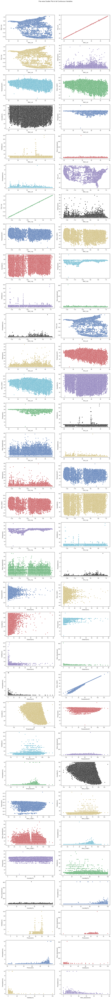

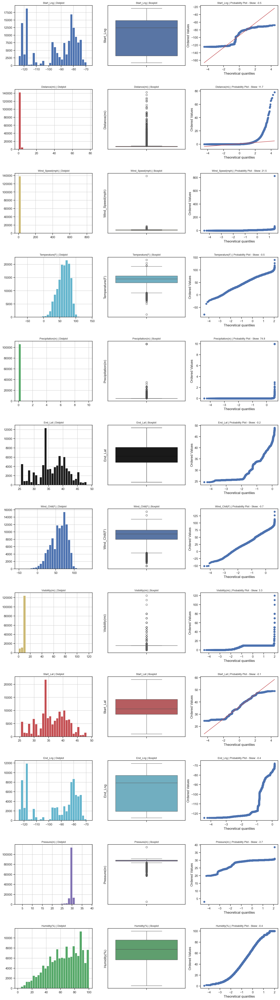

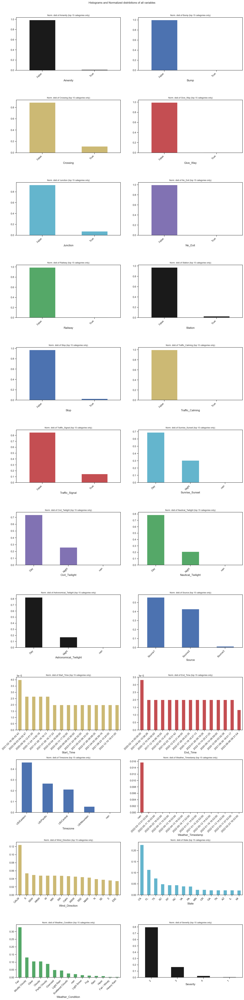

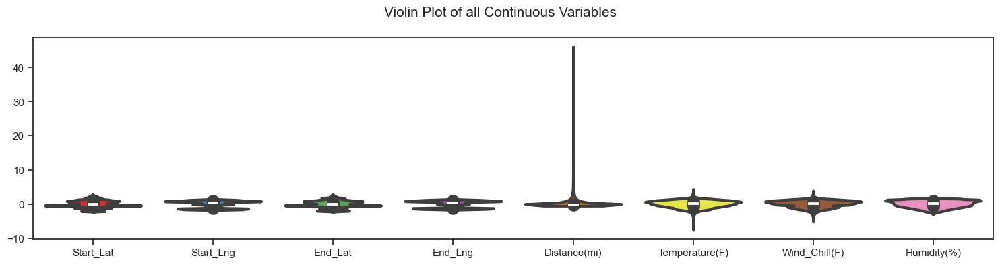

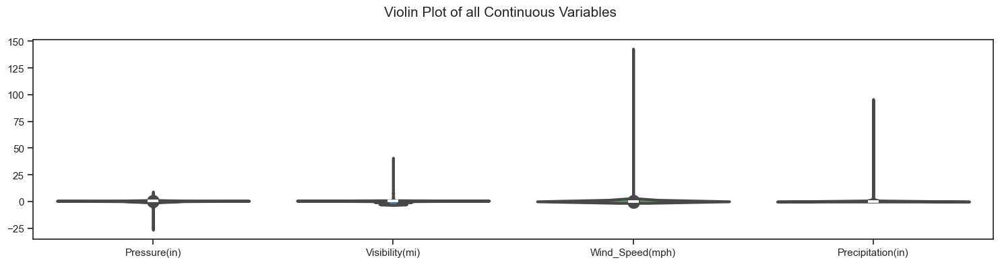

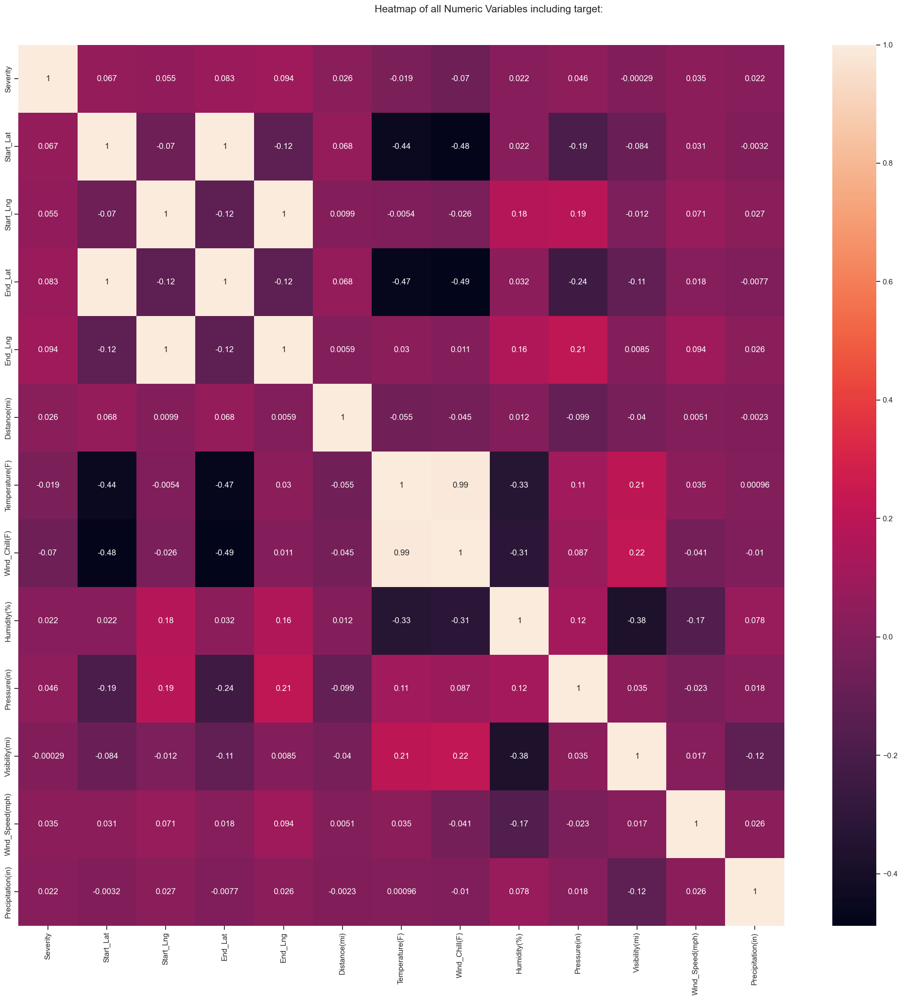

ValueError: Image size of 2000x72000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2000x72000 with 288 Axes>

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/rozaabosalah/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/rozaabosalah/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/rozaabosalah/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/rozaabosalah/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/rozaabosalah/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/rozaabosalah/nltk_data...
[nltk_data]    

Could not draw wordcloud plot for Description. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for Street. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for City. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
636706,A-646382,Source2,3,2022-04-18 18:09:09,2022-04-18 18:38:40,27.996080,-82.453850,NaN,NaN,0.000,Right lane blocked due to crash on I-275 Southbound at Exits 47 47B US-92 Hillsborough Ave.,E Hillsborough Ave,Tampa,Hillsborough,FL,33603,US,US/Eastern,KTPF,2022-04-18 18:15:00,82.0,82.0,51.0,29.91,10.0,NNW,12.0,0.0,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day
576969,A-581920,Source2,1,2022-06-27 16:58:06,2022-06-27 17:27:37,42.345219,-71.095329,NaN,NaN,0.000,Crash on Boylston St at Ipswich St.,Boylston St,Boston,Suffolk,MA,02215-3501,US,US/Eastern,KBOS,2022-06-27 16:54:00,72.0,72.0,93.0,29.87,3.0,SSW,12.0,0.0,Cloudy,True,False,True,False,False,False,False,False,True,True,False,True,False,Day,Day,Day,Day
7360419,A-7409785,Source1,2,2019-09-06 18:44:37,2019-09-06 22:44:37,45.526440,-122.686730,45.527220,-122.686760,0.054,At Everett St/Exit 2 - Accident.,I-405 N,Portland,Multnomah,OR,97209,US,US/Pacific,KPDX,2019-09-06 18:53:00,71.0,71.0,68.0,30.07,10.0,NW,12.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
5068421,A-5106833,Source1,2,2022-09-20 13:14:54.000000000,2022-09-20 14:37:00.000000000,35.782976,-78.655717,35.782677,-78.655384,0.028,Incident on HILLSBOROUGH ST near HOUSE 1209 Drive with caution.,Hillsborough St,Raleigh,Wake,NC,27603-1507,US,US/Eastern,KRDU,2022-09-20 12:51:00,88.0,88.0,43.0,29.57,10.0,ENE,8.0,0.0,Partly Cloudy,True,False,True,True,False,False,False,False,False,True,False,False,False,Day,Day,Day,Day
2223680,A-2233547,Source2,3,2019-03-22 20:05:22,2019-03-22 20:57:04,25.985430,-80.165642,NaN,NaN,0.000,4 right lane blocked due to accident on I-95 Northbound before Exit 18 I-95 Express Ln.,I-95 N,Hallandale,Broward,FL,33009,US,US/Eastern,KFLL,2019-03-22 19:53:00,69.1,NaN,33.0,30.06,10.0,NNW,4.6,NaN,Partly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485600,A-485613,Source2,2,2017-06-10 13:33:08,2017-06-10 14:17:54,32.700405,-96.805527,NaN,NaN,0.000,Accident on Ramona Ave at Marfa Ave.,Marfa Ave,Dallas,Dallas,TX,75216-5416,US,US/Central,KRBD,2017-06-10 13:53:00,84.9,NaN,57.0,29.87,10.0,SSE,13.8,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
6444275,A-6491842,Source1,2,2021-02-19 03:37:00,2021-02-19 05:16:08,34.463393,-120.022696,34.461533,-120.008743,0.805,Incident on US-101 SB near EL CAPITAN STATEBCH Expect delays.,US-101 S,Goleta,Santa Barbara,CA,93117,US,US/Pacific,KSBA,2021-02-19 03:53:00,39.0,39.0,79.0,30.24,10.0,CALM,0.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
5848140,A-5891926,Source1,2,2021-04-12 06:43:30,2021-04-12 07:22:30,35.280350,-82.118286,35.270620,-82.148606,1.838,Slow traffic on US-74 W from NC-9/Exit 167 (US-74) to NC-108/Exit 163 (US-74) due to accident.,US-74,Columbus,Polk,NC,28722,US,US/Eastern,KFQD,2021-04-12 06:35:00,50.0,50.0,58.0,28.60,10.0,WSW,5.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Day,Day,Day
784426,A-794134,Source2,2,2021-12-03 13:45:24,2021-12-03 14:15:01,26.707426,-80.133675,NaN,NaN,0.000,Three lanes blocked due to accident on FL-704 O

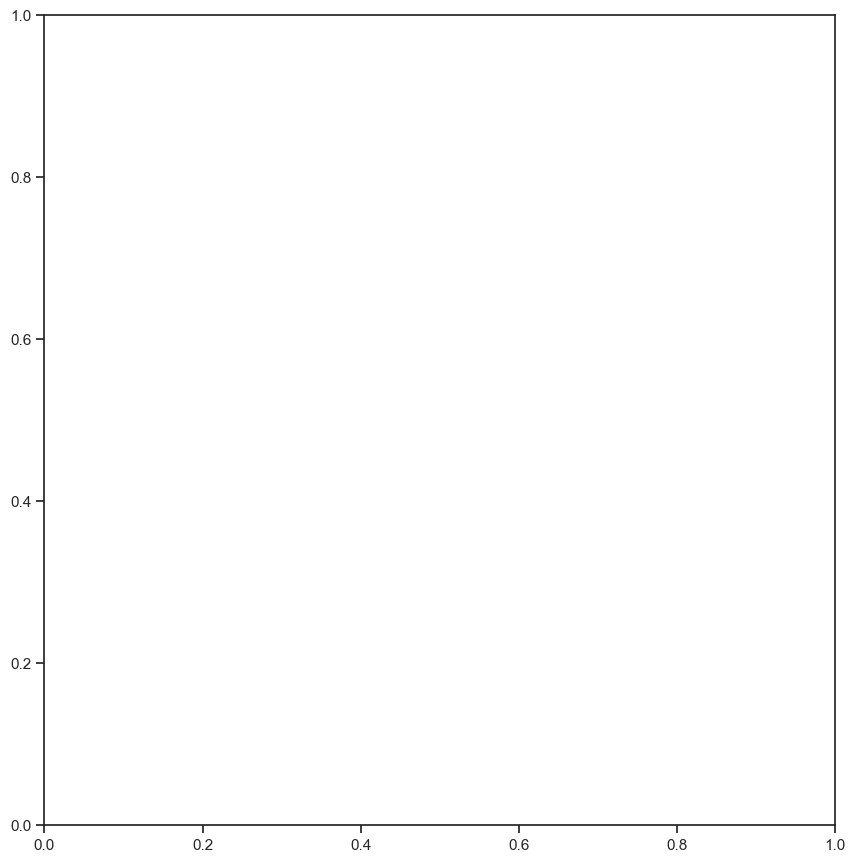

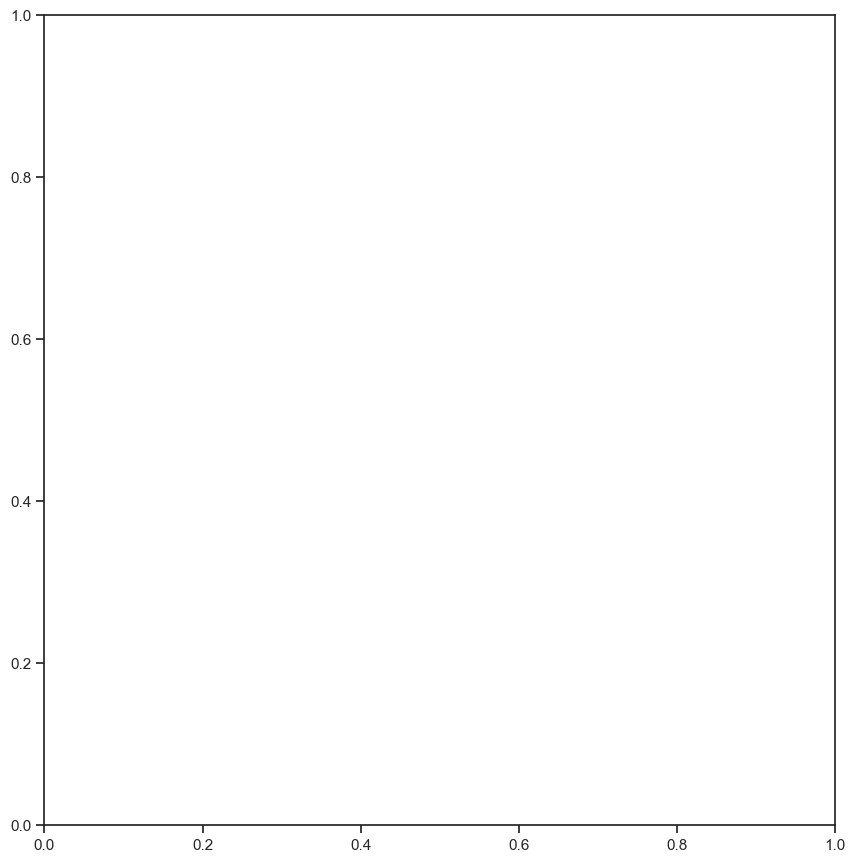

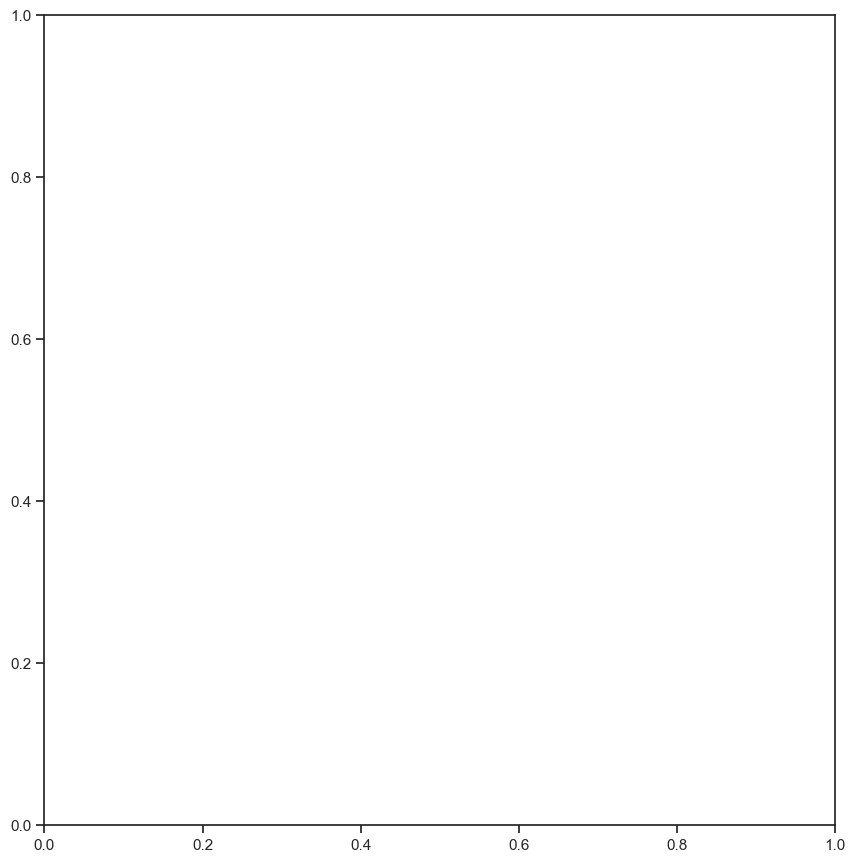

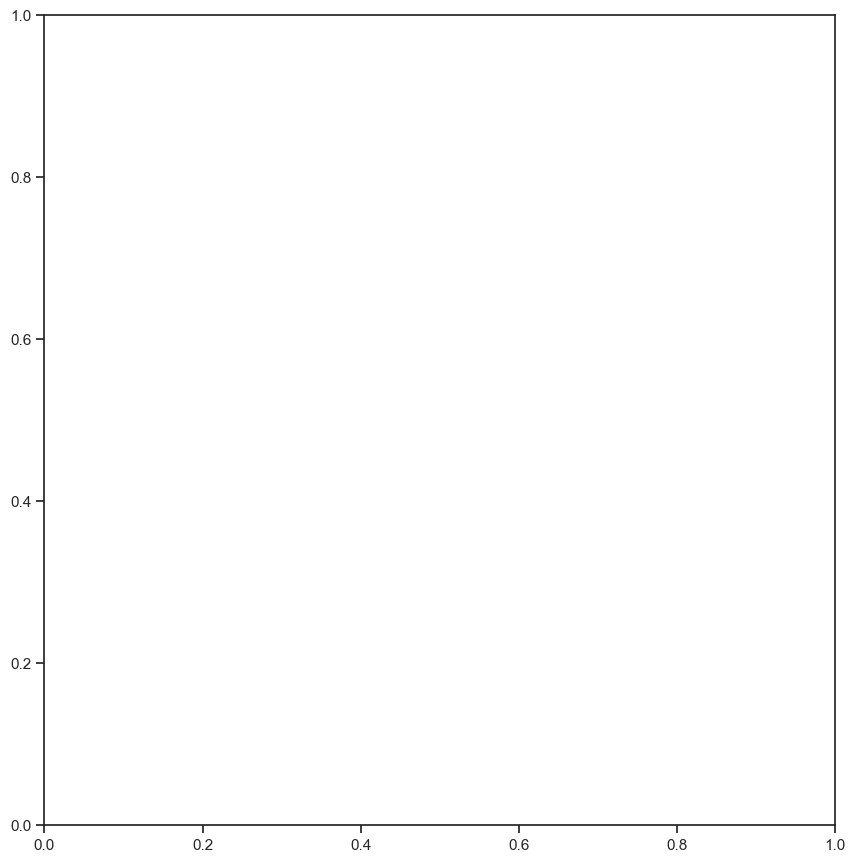

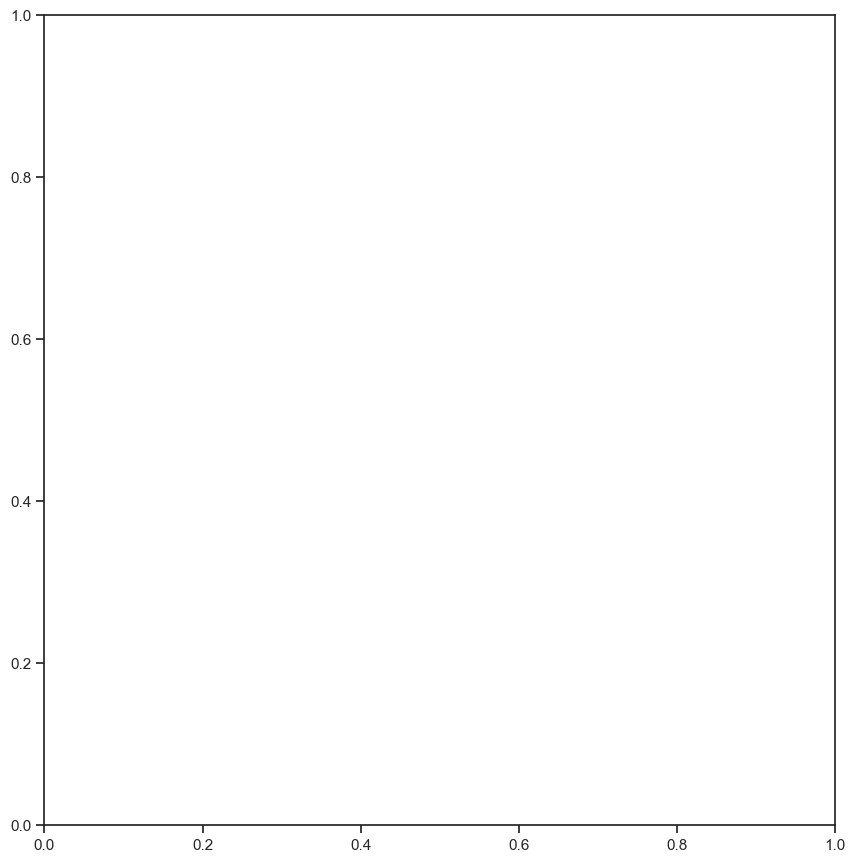

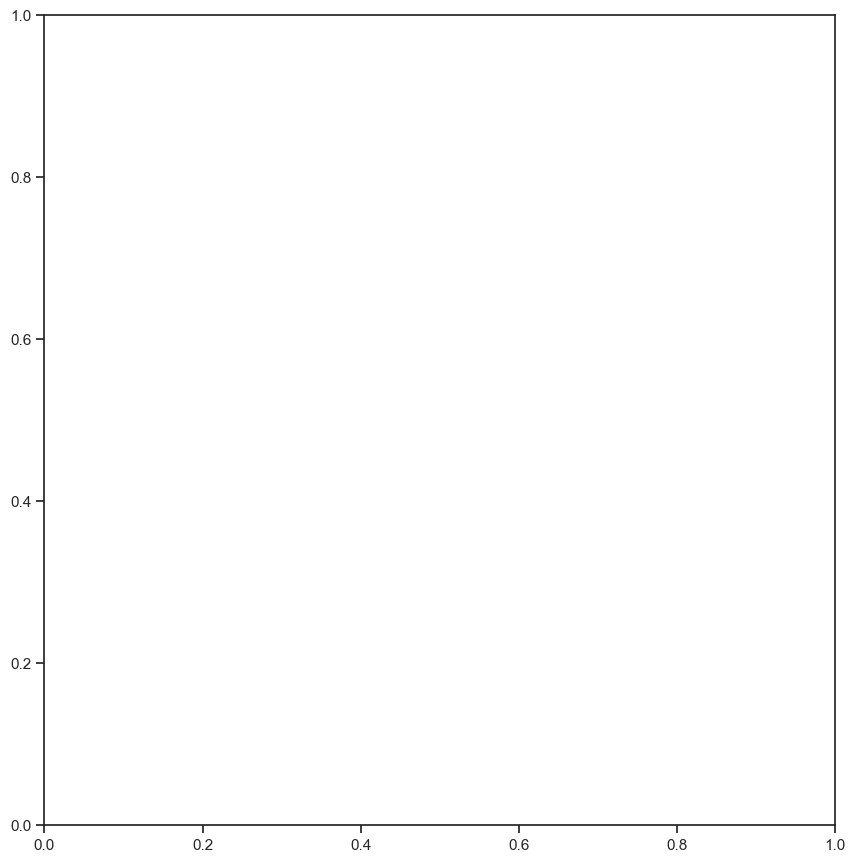

In [8]:
#Descriptive Statistics

#AutoViz - Automated reports

#!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
AV.AutoViz("/Users/rozaabosalah/Desktop/ML project/US_Accidents_March23.csv")

In [9]:
#Descriptive Statistics

df.describe().T

,count,mean,min,25%,50%,75%,max,std
Start_Time,6985228,2020-03-21 21:49:59.056443136,2016-01-14 20:18:33,2018-09-17 02:20:31.750000128,2020-06-23 13:37:23.500000,2021-10-28 15:44:07,2023-03-31 23:30:00,NaN
End_Time,6985228,2020-03-22 04:56:51.646936064,2016-02-08 06:37:08,2018-09-17 05:23:37.500000,2020-06-23 15:20:42,2021-10-29 14:57:46.500000,2023-03-31 23:59:00,NaN
Start_Lat,7728394.0,36.201195,24.5548,33.399631,35.823974,40.084959,49.002201,5.076079
Start_Lng,7728394.0,-94.702545,-124.623833,-117.219396,-87.766616,-80.353676,-67.113167,17.391756
End_Lat,4325632.0,36.261829,24.566013,33.46207,36.183495,40.17892,49.075,5.272905
End_Lng,4325632.0,-95.72557,-124.545748,-117.754345,-88.02789,-80.247086,-67.109242,18.107928
Distance(mi),7728394.0,0.561842,0.0,0.0,0.03,0.464,441.75,1.776811
Weather_Timestamp,7608166,2020-06-02 10:06:41.888674560,2016-01-14 19:51:00,2018-11-20 18:35:00,2020-11-10 13:53:00,2022-01-19 14:27:00,2023-03-31 23:53:00,NaN
Temperature(F),7564541.0,61.663286,-89.0,49.0,64.0,76.0,207.0,19.013653
Wind_Chill(F),5729375.0,58.251048,-89.0,43.0,62.0,75.0,207.0,22.389832


In [10]:
#reminder, research question:
#Can we predict the duration of a traffic accident at the time it is first reported, using weather, location, and time features?

In [10]:
df['Duration_Minutes'].max()

2812939.0

In [11]:
df['Duration_Hours'].max()

46882.316666666666

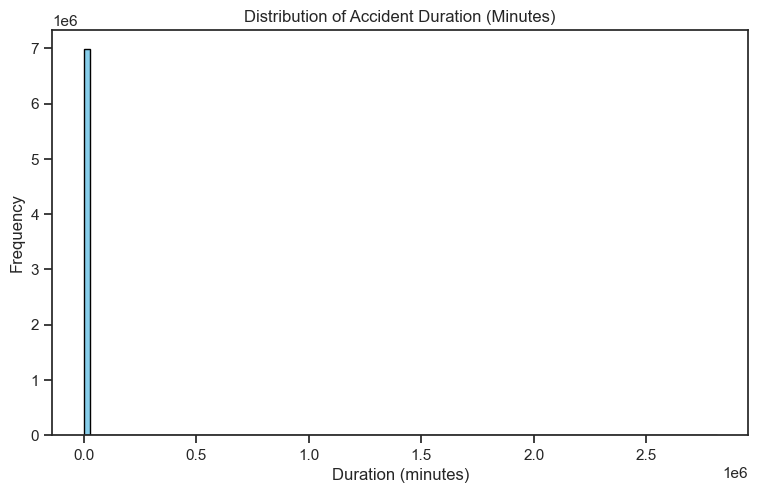

In [12]:
#Target Value = Duration_Minutes

import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(df['Duration_Minutes'], bins=100, color='skyblue', edgecolor='black')
plt.title('Distribution of Accident Duration (Minutes)')
plt.xlabel('Duration (minutes)')
plt.ylabel('Frequency')
plt.show()


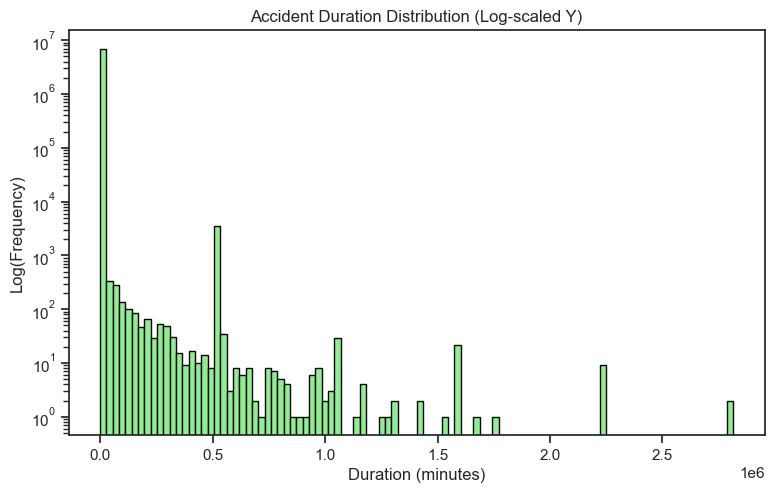

In [14]:
#histogram plot with log to reduce long tail effect

plt.figure(figsize=(8,5))
plt.hist(df['Duration_Minutes'], bins=100, color='lightgreen', edgecolor='black')
plt.yscale('log')
plt.title('Accident Duration Distribution (Log-scaled Y)')
plt.xlabel('Duration (minutes)')
plt.ylabel('Log(Frequency)')
plt.show()


In [13]:
print(f" average duration of accidents in minutes:", df['Duration_Minutes'].mean())

 average duration of accidents in minutes: 426.87650818746846


In [16]:
df['Weather_Condition'].value_counts()

Weather_Condition
Fair                2560802
Mostly Cloudy       1032703
Cloudy               834117
Clear                808743
Partly Cloudy        709213
Overcast             382866
Light Rain           366554
Scattered Clouds     204829
Rain                 139324
Light Snow           128680
Fog                   99238
Other                 87441
Haze                  76223
Fair / Windy          35671
Thunder               31813
T-Storm               16810
Snow                  15537
Smoke                 12668
Wintry Mix            11703
Name: count, dtype: int64

In [17]:
df['Weather_Condition'] = df['Weather_Condition'].replace({
    'Haze': 'Other',
    'Fair / Windy': 'Other',
    'Thunder': 'Other',
    'T-Storm': 'Other',
    'Snow': 'Other',
    'Smoke': 'Other',
    'Wintry Mix': 'Other'})

df['Weather_Condition'].value_counts()

Weather_Condition
Fair                2560802
Mostly Cloudy       1032703
Cloudy               834117
Clear                808743
Partly Cloudy        709213
Overcast             382866
Light Rain           366554
Other                287866
Scattered Clouds     204829
Rain                 139324
Light Snow           128680
Fog                   99238
Name: count, dtype: int64

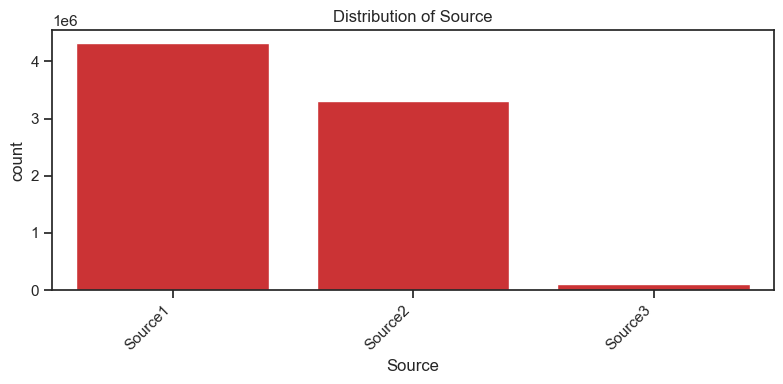

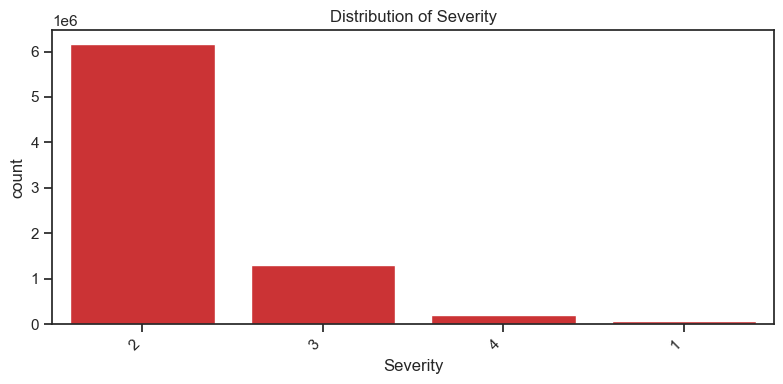

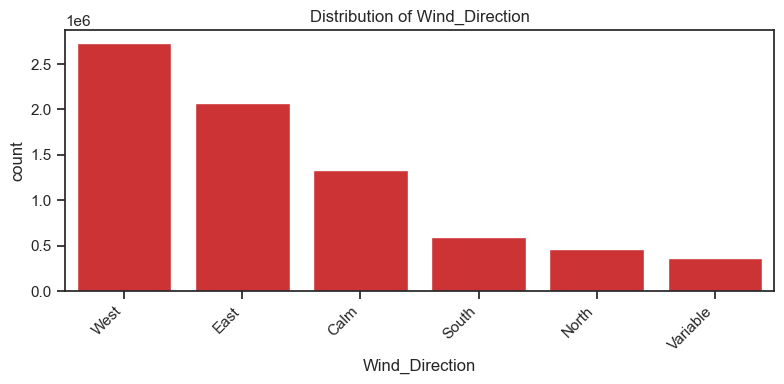

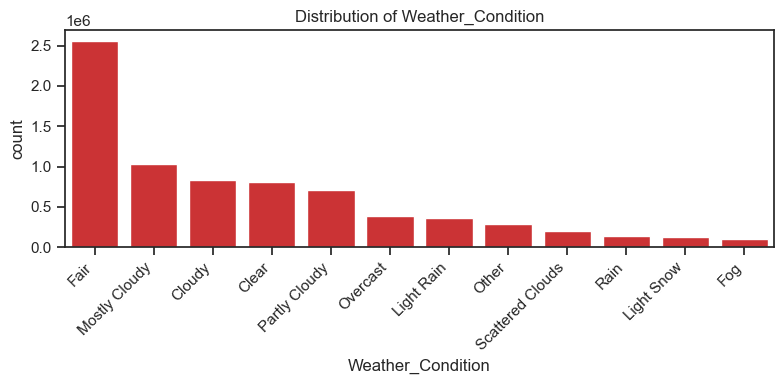

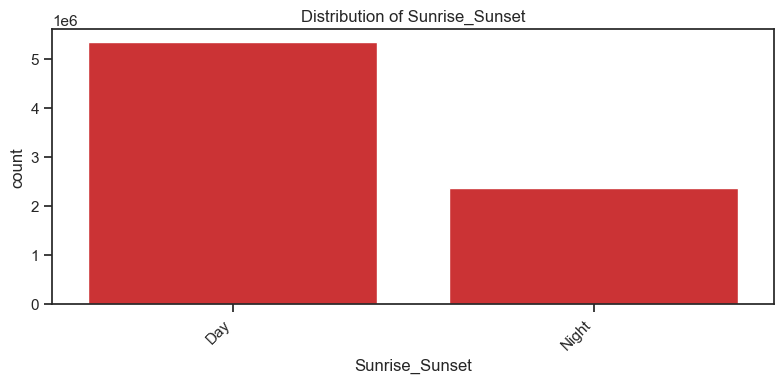

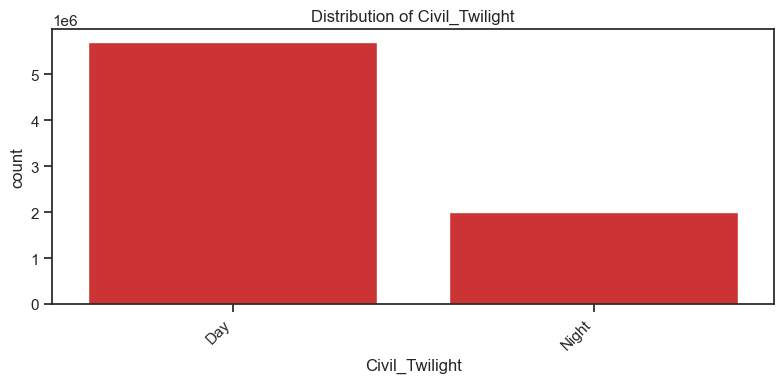

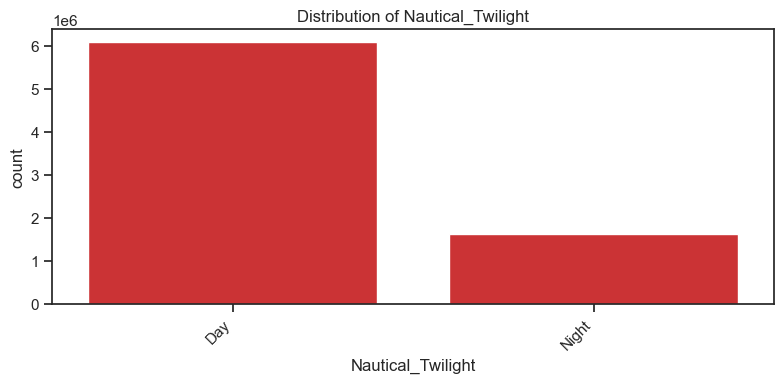

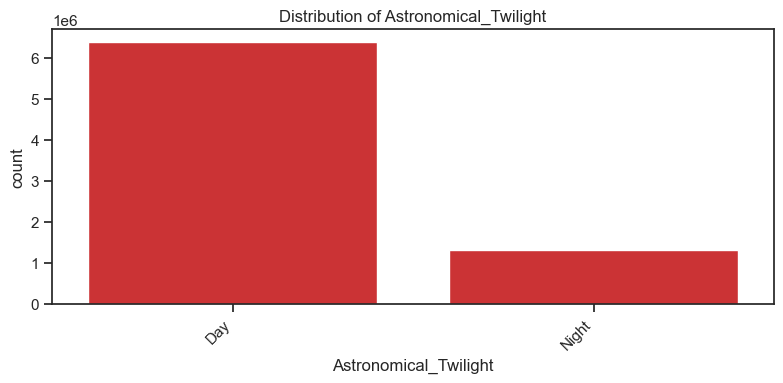

In [18]:
#Categorical Variables Plots - Bar plots

# Filter out the categorical columns
categorical_cols = df.select_dtypes(include=['category'])
# Plot each categorical variable
for col in categorical_cols:
    plt.figure(figsize=(8,4))
    sns.countplot(x=col, data=df, order=df[col].value_counts().index)
    plt.title(f"Distribution of {col}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

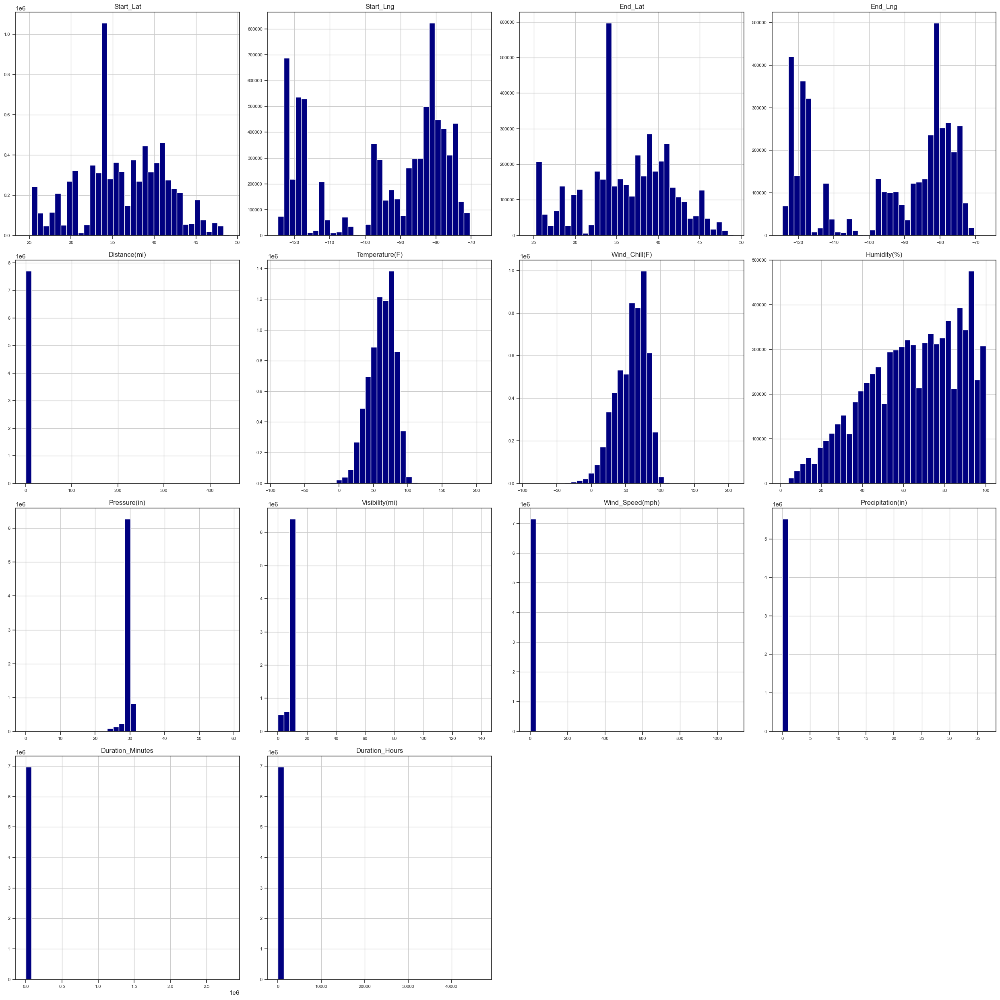

In [19]:
#Countinous Variables Plots - Histograms
# Filter out the continous columns

continuous_cols = [
    'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng',
    'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)',
    'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
    'Wind_Speed(mph)', 'Precipitation(in)',
    'Duration_Minutes', 'Duration_Hours'
]

continous_df = df[continuous_cols]

continous_df.hist(figsize=(25, 25), bins=35, color='navy', xlabelsize=8, ylabelsize=8)
plt.tight_layout()
plt.show()


In [20]:
continous_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 14 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Start_Lat          float64
 1   Start_Lng          float64
 2   End_Lat            float64
 3   End_Lng            float64
 4   Distance(mi)       float64
 5   Temperature(F)     float64
 6   Wind_Chill(F)      float64
 7   Humidity(%)        float64
 8   Pressure(in)       float64
 9   Visibility(mi)     float64
 10  Wind_Speed(mph)    float64
 11  Precipitation(in)  float64
 12  Duration_Minutes   float64
 13  Duration_Hours     float64
dtypes: float64(14)
memory usage: 825.5 MB


Detected 22 continuous columns and 8 discrete columns.



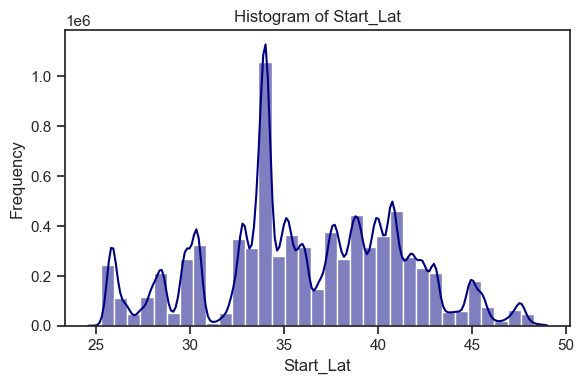

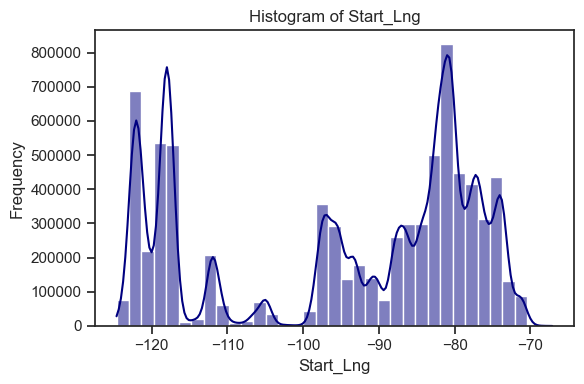

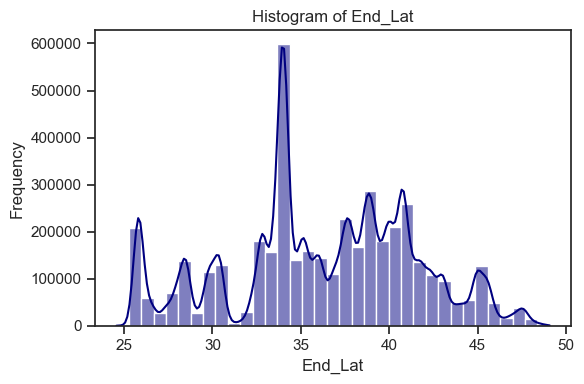

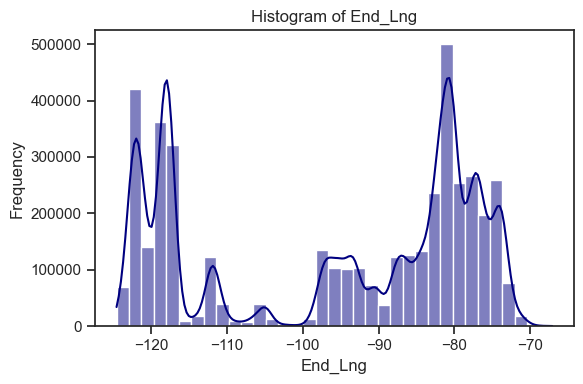

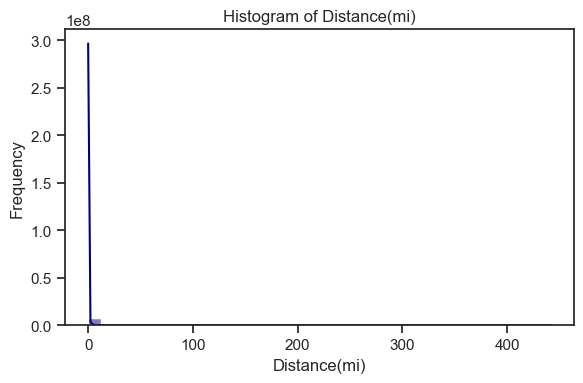

...

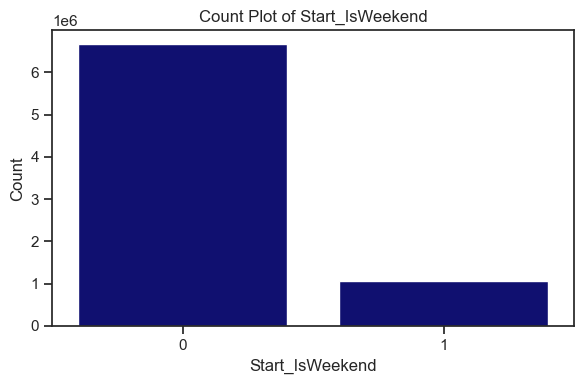

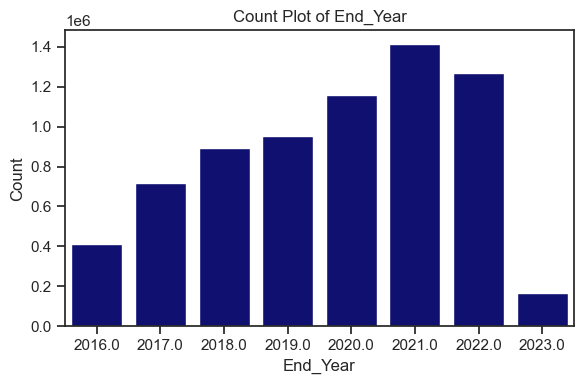

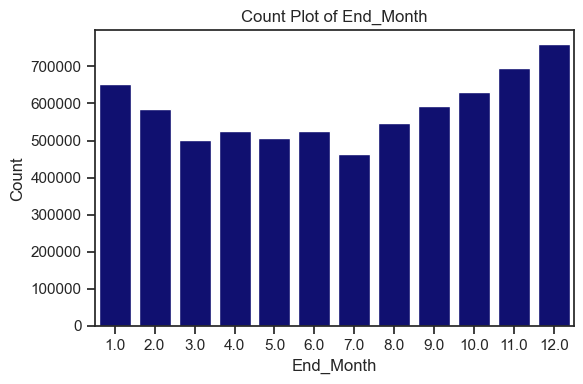

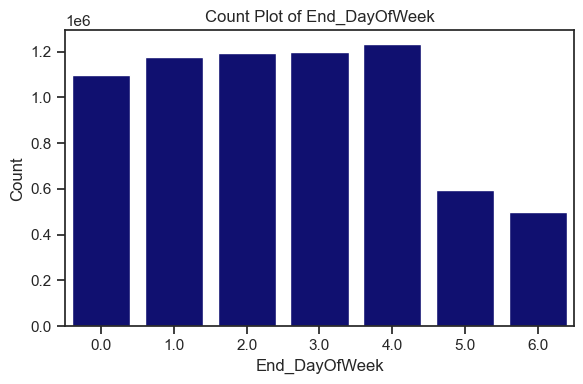

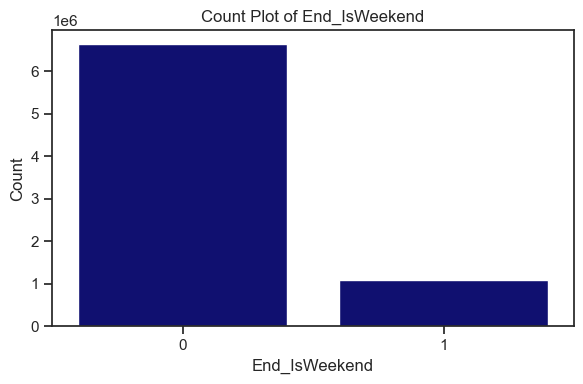

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def plot_numeric_distributions(df, unique_threshold=20):
    """
    Automatically plots histograms for continuous variables and
    bar plots (countplots) for discrete / categorical-like numeric variables.
    
    Parameters:
    -----------
    df : pd.DataFrame
        Your dataset
    unique_threshold : int
        Maximum number of unique values to consider a column as discrete
    """
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=['number'])
    
    continuous_cols = []
    discrete_cols = []
    
    # Separate continuous vs discrete
    for col in numeric_df.columns:
        unique_vals = numeric_df[col].nunique()
        if unique_vals <= unique_threshold:
            discrete_cols.append(col)
        else:
            continuous_cols.append(col)
    
    print(f"Detected {len(continuous_cols)} continuous columns and {len(discrete_cols)} discrete columns.\n")
    
    # --- Plot Continuous Variables ---
    for col in continuous_cols:
        plt.figure(figsize=(6, 4))
        sns.histplot(df[col], kde=True, color='navy', bins=35)
        plt.title(f'Histogram of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
    
    # --- Plot Discrete Variables ---
    for col in discrete_cols:
        plt.figure(figsize=(6, 4))
        sns.countplot(x=col, data=df, color='navy')
        plt.title(f'Count Plot of {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.tight_layout()
        plt.show()

plot_numeric_distributions(df)


In [22]:
#Skewenes
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default  
pd.DataFrame(continous_df.skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

'''
| Skewness value | Interpretation           | Distribution shape                                      
| ≈ 0            | symmetric                | bell-shaped                                             |
| > +1           | **strong positive skew** | long right tail (many small values, few large outliers) |
| < -1           | **strong negative skew** | long left tail (many large values, few small outliers)  |
'''

'\n| Skewness value | Interpretation           | Distribution shape                                      \n| ≈ 0            | symmetric                | bell-shaped                                             |\n| > +1           | **strong positive skew** | long right tail (many small values, few large outliers) |\n| < -1           | **strong negative skew** | long left tail (many large values, few small outliers)  |\n'

In [23]:
#Correlations

continous_df.corr() #Pearson in default

,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Duration_Minutes,Duration_Hours
Start_Lat,1.000000,-0.067720,0.999993,-0.121743,0.064064,-0.443781,-0.480296,0.022364,-0.194094,-0.088500,0.032908,0.000279,-0.017728,-0.017728
Start_Lng,-0.067720,1.000000,-0.121735,0.999999,0.007851,-0.010652,-0.031810,0.179500,0.193185,-0.015322,0.077353,0.027619,0.001893,0.001893
End_Lat,0.999993,-0.121735,1.000000,-0.121732,0.067932,-0.468692,-0.489578,0.027849,-0.242143,-0.116199,0.017373,-0.003639,-0.024501,-0.024501
End_Lng,-0.121743,0.999999,-0.121732,1.000000,0.005876,0.024084,0.006733,0.167428,0.216028,0.006155,0.092303,0.025536,0.005286,0.005286
Distance(mi),0.064064,0.007851,0.067932,0.005876,1.000000,-0.054082,-0.044309,0.008780,-0.093121,-0.037225,0.008989,-0.001480,0.015392,0.015392
Temperature(F),-0.443781,-0.010652,-0.468692,0.024084,-0.054082,1.000000,0.993744,-0.330939,0.109500,0.217173,0.033750,-0.004633,0.002303,0.002303
Wind_Chill(F),-0.480296,-0.031810,-0.489578,0.006733,-0.044309,0.993744,1.000000,-0.314731,0.086598,0.234022,-0.043008,-0.012143,0.005683,0.005683
Humidity(%),0.022364,0.179500,0.027849,0.167428,0.008780,-0.330939,-0.314731,1.000000,0.115573,-0.384261,-0.172403,0.076936,0.007036,0.007036
Pressure(in),-0.194094,0.193185,-0.242143,0.216028,-0.093121,0.109500,0.086598,0.115573,1.000000,0.038161,-0.022609,0.016511,0.005349,0.005349
Visibility(mi),-0.088500,-0.015322,-0.116199,0.006155,-0.037225,0.217173,0.234022,-0.384261,0.038161,1.000000,0.014650,-0.119796,0.001333,0.001333


<Axes: >

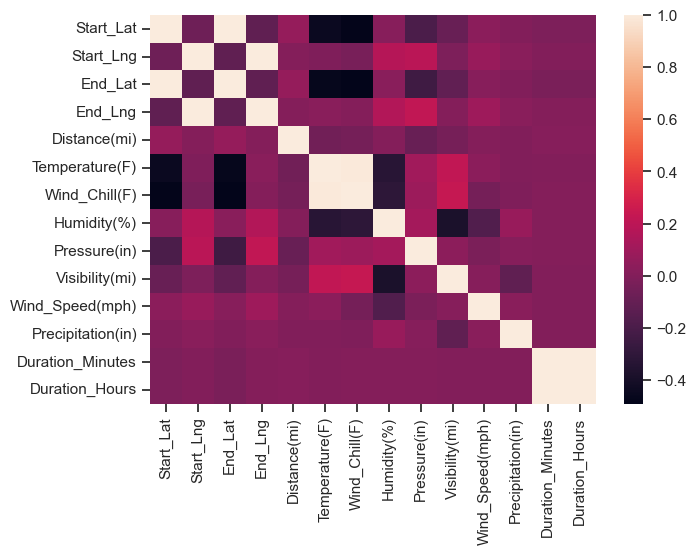

In [24]:
sns.heatmap(continous_df.corr())

In [26]:
continous_df.corr(method='spearman')

,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Duration_Minutes,Duration_Hours
Start_Lat,1.000000,0.055949,0.999976,0.005642,0.063785,-0.427762,-0.467371,0.030804,-0.191428,-0.091476,0.035086,0.067584,0.013926,0.013926
Start_Lng,0.055949,1.000000,0.005627,0.999986,0.040094,0.011891,0.001681,0.121924,0.140918,0.020022,0.066838,0.046087,-0.014142,-0.014142
End_Lat,0.999976,0.005627,1.000000,0.005642,0.090019,-0.451290,-0.471477,0.042948,-0.263772,-0.119688,0.020149,0.073106,0.015708,0.015708
End_Lng,0.005642,0.999986,0.005642,1.000000,0.094800,0.047240,0.041100,0.101688,0.156448,0.043724,0.085246,0.034244,-0.013824,-0.013824
Distance(mi),0.063785,0.040094,0.090019,0.094800,1.000000,-0.058015,-0.010106,-0.018664,-0.125037,-0.008579,-0.004650,-0.033040,0.403497,0.403497
Temperature(F),-0.427762,0.011891,-0.451290,0.047240,-0.058015,1.000000,0.998771,-0.330554,-0.003629,0.223940,0.087642,-0.124167,-0.023681,-0.023681
Wind_Chill(F),-0.467371,0.001681,-0.471477,0.041100,-0.010106,0.998771,1.000000,-0.324195,-0.016986,0.235724,0.042209,-0.139003,0.017080,0.017080
Humidity(%),0.030804,0.121924,0.042948,0.101688,-0.018664,-0.330554,-0.324195,1.000000,0.057486,-0.465369,-0.198430,0.371205,-0.021344,-0.021344
Pressure(in),-0.191428,0.140918,-0.263772,0.156448,-0.125037,-0.003629,-0.016986,0.057486,1.000000,0.067282,-0.000137,0.007175,-0.139352,-0.139352
Visibility(mi),-0.091476,0.020022,-0.119688,0.043724,-0.008579,0.223940,0.235724,-0.465369,0.067282,1.000000,0.055224,-0.445925,0.011855,0.011855


T-statistic: nan
P-value: nan
No statistically significant difference in accident duration between weekends and weekdays.


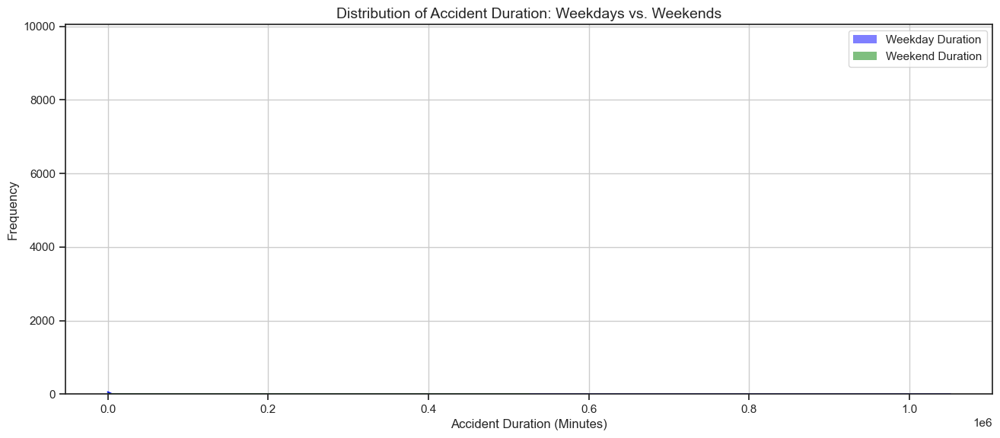

In [27]:
#trying to check differences between weekend vs weekdays via t test 

from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

# Randomly sample 50,000 rows (adjust as needed)
df_sample = df.sample(n=50000, random_state=42)

# Continue with your code using df_sample
weekday_duration = df_sample[df_sample['Start_IsWeekend'] == 0]['Duration_Minutes']
weekend_duration = df_sample[df_sample['Start_IsWeekend'] == 1]['Duration_Minutes']

# Perform an independent samples t-test (Welch’s t-test by default)
t_stat, p_value = stats.ttest_ind(weekend_duration, weekday_duration, equal_var=False)

# Print the results
print(f"T-statistic: {t_stat:.4f}")
print(f"P-value: {p_value:.6f}")

# Interpret results
alpha = 0.05
if p_value < alpha:
    print("There is a statistically significant difference in accident duration between weekends and weekdays.")
else:
    print("No statistically significant difference in accident duration between weekends and weekdays.")

# Plotting the distributions
plt.figure(figsize=(14, 6))
sns.histplot(weekday_duration, kde=True, color='blue', label='Weekday Duration', alpha=0.5)
sns.histplot(weekend_duration, kde=True, color='green', label='Weekend Duration', alpha=0.5)
plt.title('Distribution of Accident Duration: Weekdays vs. Weekends', fontsize=14)
plt.xlabel('Accident Duration (Minutes)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()


Pearson correlation coefficient: -0.0005
P-value: 0.913855
No significant correlation between wind speed and accident duration.


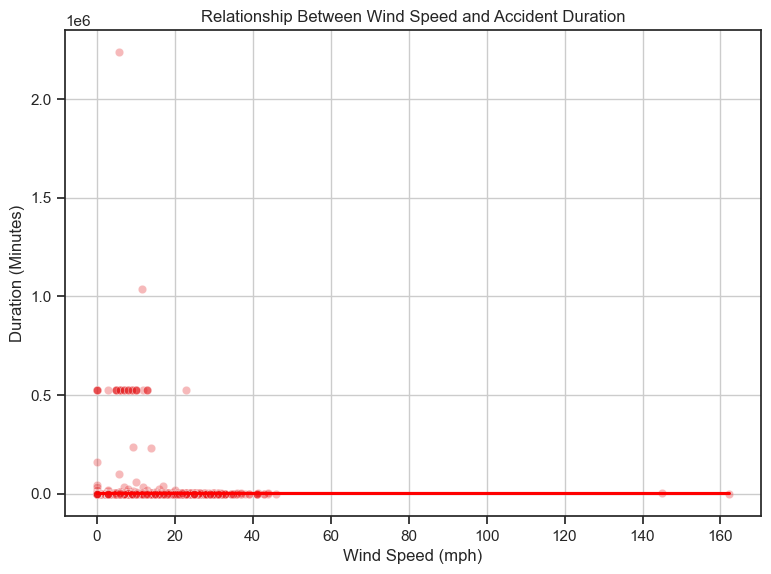

In [28]:
#Does accident duration change as wind speed increases? via correlation

from scipy import stats

# Drop missing values
subset = df[['Wind_Speed(mph)', 'Duration_Minutes']].dropna()

# Limit to a smaller random sample to speed up computation and plotting
subset = subset.sample(n=50000, random_state=42)

# Pearson correlation (for linear relationship)
r, p_value = stats.pearsonr(subset['Wind_Speed(mph)'], subset['Duration_Minutes'])

print(f"Pearson correlation coefficient: {r:.4f}")
print(f"P-value: {p_value:.6f}")

if p_value < 0.05:
    print("Significant correlation between wind speed and accident duration.")
else:
    print("No significant correlation between wind speed and accident duration.")


plt.figure(figsize=(8,6))
sns.scatterplot(x='Wind_Speed(mph)', y='Duration_Minutes', data=subset, alpha=0.3)
sns.regplot(x='Wind_Speed(mph)', y='Duration_Minutes', data=subset, scatter=False, color='red')
plt.title('Relationship Between Wind Speed and Accident Duration')
plt.xlabel('Wind Speed (mph)')
plt.ylabel('Duration (Minutes)')
plt.grid(True)
plt.show()



In [29]:
#saving the pickle file

df.to_pickle('df_after_eda.pkl')
